In [1]:
%matplotlib inline

from pathlib import Path
from drone_detector.tiling import *
import os, sys
import geopandas as gpd

# Introduction

Deadwood and decaying wood, both standing and fallen, is a vital component for the biodiversity of forests, as it offers a home for several endangered species (such as fungi, mosses, insects and birds). However, when comparing European countries, Finland ranks on the bottom in the amount of both standing and fallen deadwood (m³/ha), with on average only 6 m³/ha of both deadwood types. There are, however, large differences between different forest types, as non-managed old-growth forests have several times more deadwood compared to managed forests.

[Kattenborn2019](http://dx.doi.org/10.1016/j.rse.2019.03.025) propose that UAVs are in some cases an efficient alternative for traditional field sampling. For instance, if the goal is to estimate spatial coverage of a single species, utilizing plot-based or point-based field sampling data has several challenges, such as spatial inaccuracies and limited spatial coverage. Moreover, acquiring field data is labour intensive and costly. UAVs, on the other hand, provide continuous, georeferenced field data in larger quantities than field sampling. Because these data have very high spatial resolution, it is possible for experts to visually identify the target of interest. Of course, this type of ground reference data has its limitations, as it is only possible to identify objects that are visible from the data, and if the target is to estimate e.g. growing stock volume or basal area, field work is then needed. 

To the best of our knowledge, there are no previous work about deadwood detection, standing or fallen, from UAV images using state-of-the-art object detection models. This work aims to produce a tool that can be used to generate deadwood tree species map automatically and accurately from captured RGB imagery. We will also address the shortcomings for deadwood mapping using only UAV imagery.

# Materials and methods

## Study area

The study area is located in the eastern side of Hiidenportti National Park, Eastern-Finland, and the field data contains areas both inside and outside the conserved areas (Hiidenportti National Park in the west and Teerisuo - Lososuo area in the east). The most common trees in Hiidenportti area are Scots pine and Norway spruce, with different deciduous trees (e.g. Silver birch, Downy birch and European aspen).

## Field data

The nine partially overlapping UAV orthoimages cover approximately 10 km² area, with spatial resolution ranging between 3.9cm and 4.4cm. These scenes cover both conserved and managed forests, as well as some logging openings. 

In order to generate the ground reference data, an expert manually annotated around 5000 deadwood, both standing and fallen, from the images. As we have sample plots measured in the area, all deadwood was annotated in 100 times 100m (around 2300 times 2300 pixels) square centered around a plot center. After final visual interpretation to check which plots have sufficient image quality, this process resulted in 74 partially overlapping plots, with 4482 annotated fallen deadwood polygons and 409 standing deadwood polygons. From these 74 plots, 10 spatially distinct, non-overlapping plots were excluded from the training data and used only for testing the model performance.

## Training data generation

Explanations come later.

In [2]:
tile_folder = Path('../data/hiidenportti/raw/plot_patches/')
vector_folder = Path('../data/hiidenportti/raw/vector_plots/')

outpath = Path('../data/hiidenportti/processed/')

tiles = os.listdir(tile_folder)
vectors = [f for f in os.listdir(vector_folder) if f.endswith('shp')]
assert len(tiles) == len(vectors)

In [3]:
import rasterio as rio

In [8]:
for t in tiles:
    with rio.open(tile_folder/t) as f:
        im = f.read()
        tilesize = min(im.shape[1], im.shape[2])/4
    if not os.path.exists(outpath/t[:-4]): os.makedirs(outpath/t[:-4])
    shp_fname = f'{t.split("_")[0]}.shp'
    #tilesize = 500
    tiler = Tiler(outpath=outpath/t[:-4], gridsize_x=tilesize, gridsize_y=tilesize, overlap=(0,0))
    tiler.tile_raster(str(tile_folder/t))
    tiler.tile_vector(vector_folder/shp_fname)

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

In [9]:
from shapely.geometry import box

In [10]:
# Fix labelling, todo fix it in COCOProcessor

for p in os.listdir(outpath):
    files = [outpath/p/'vector_tiles'/f for f in os.listdir(outpath/p/'vector_tiles') if f.endswith('geojson')]
    for f in files: 
        gdf = gpd.read_file(f)
        bbox = box(*gdf.total_bounds)
        gdf['geometry'] = gdf.geometry.buffer(0.05) # Two pixel buffer maybe?
        gdf.rename(columns={'groundwood':'label'}, inplace=True)
        gdf = gpd.clip(gdf, bbox, keep_geom_type=True)
        gdf['label'] = gdf.apply(lambda row: 'Standing' if row.label == 1 else 'Fallen', axis=1)
        gdf.to_file(f, driver='GeoJSON')

In [11]:
# Convert to COCO format

from drone_detector.coco import *

deadwood_categories = [
        {'supercategory':'deadwood', 'id':1, 'name': 'Standing'},
        {'supercategory':'deadwood', 'id':2, 'name': 'Fallen'},
    ]

from datetime import date

coco_info = {'description': 'Dataset for deadwood detection in Hiidenportti',
             'version': 0.1,
             'year': 2021,
             'contributor': 'Janne Mäyrä',
             'date_created': date.today().strftime("%Y/%m/%d")
}

coco_licenses = {}

for p in os.listdir(outpath):
    coco_processor = COCOProcessor(outpath/p, outpath/p, coco_info=coco_info, coco_licenses=coco_licenses,
                                  coco_categories=deadwood_categories)
    coco_processor.shp_to_coco()

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [12]:
# Combine several coco-annotation .json files into one

import json

full_coco = None
image_id_modifier = 0
ann_id_modifier = 0
for p in os.listdir(outpath):
    with open(outpath/p/'coco.json') as f:
        coco = json.load(f)
    
    # update filename
    for i in coco['images']:
        i['file_name'] = f"{p}/raster_tiles/{i['file_name']}"
        
    if full_coco is None: 
        full_coco = coco
        image_id_modifier = full_coco['images'][-1]['id']
        ann_id_modifier = full_coco['annotations'][-1]['id']
    else:
        for i in coco['images']:
            i['id'] += image_id_modifier
        for a in coco['annotations']:
            a['image_id'] += image_id_modifier
            a['id'] += ann_id_modifier
        
        full_coco['images'].extend(coco['images'])
        full_coco['annotations'].extend(coco['annotations'])
        image_id_modifier = full_coco['images'][-1]['id'] + 1
        ann_id_modifier = full_coco['annotations'][-1]['id'] + 1
        
with open(outpath/'full_hiidenportti_coco.json', 'w') as outfile: json.dump(full_coco, outfile)

In [4]:
from icevision.all import *

In [14]:
parser = parsers.COCOMaskParser(outpath/'full_hiidenportti_coco.json', img_dir=outpath)
class_map = ClassMap(['Standing', 'Fallen'])
train, valid = parser.parse()

  0%|          | 0/5970 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/938 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 1) - Clipping bbox ymax from 556.0 to image height 555 (Before: <BBox (xmin:225.85873831622303, ymin:537.4354051053524, xmax:238.47525388747454, ymax:556.0)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 3) - Clipping bbox ymax from 556.0 to image height 555 (Before: <BBox (xmin:308.7645358145237, ymin:509.454681456089, xmax:318.02462980151176, ymax:556.0)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 4) - Clipping bbox ymax from 555.4161586463451 to image height 555 (Before: <BBox (xmin:215.58791904337704, ymin:514.3265290856361, xmax:262.15616590715945, ymax:555.4161586463451)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 5) - Clipping bbox ymax from 555.5000000298023 to image height 555 (Before: <BBox (xmin:440.9509346652776, ymin:552.3850167393684, xmax:452.7956115268171, ymax:555.5000000298023)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS 

AUTOFIX-SUCCESS - (record_id: 92) - Clipping bbox ymax from 517.5 to image height 517 (Before: <BBox (xmin:409.03537145629525, ymin:445.14742279052734, xmax:481.46568089723587, ymax:517.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 94) - Clipping bbox ymax from 517.25 to image height 517 (Before: <BBox (xmin:30.868333945050836, ymin:373.402987241745, xmax:199.96167442947626, ymax:517.25)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 94) - Clipping bbox ymax from 517.25 to image height 517 (Before: <BBox (xmin:272.4290589913726, ymin:513.2980219125748, xmax:276.6152738928795, ymax:517.25)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 94) - Clipping bbox ymax from 517.25 to image height 517 (Before: <BBox (xmin:311.35023279860616, ymin:454.33178731799126, xmax:314.8394224178046, ymax:517.25)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 98) - Clipping bbox ym

AUTOFIX-SUCCESS - (record_id: 156) - Clipping bbox ymax from 520.5 to image height 520 (Before: <BBox (xmin:59.24090205878019, ymin:515.4903167188168, xmax:72.04753271490335, ymax:520.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 157) - Clipping bbox ymax from 520.5 to image height 520 (Before: <BBox (xmin:502.45967242866755, ymin:503.9239794909954, xmax:516.0407547969371, ymax:520.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 157) - Clipping bbox ymax from 520.5 to image height 520 (Before: <BBox (xmin:465.1971918232739, ymin:464.22602236270905, xmax:477.60827681049705, ymax:520.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 158) - Clipping bbox xmax from 520.7499999981374 to image width 520 (Before: <BBox (xmin:482.0757065117359, ymin:201.0899660885334, xmax:520.7499999981374, ymax:278.20630145072937)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 164

AUTOFIX-SUCCESS - (record_id: 254) - Clipping bbox xmax from 525.5 to image width 525 (Before: <BBox (xmin:489.4512663371861, ymin:395.03615468740463, xmax:525.5, ymax:445.6125803887844)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 255) - Clipping bbox xmax from 525.5 to image width 525 (Before: <BBox (xmin:464.7310650572181, ymin:433.73353788256645, xmax:525.5, ymax:488.2524335384369)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 256) - Clipping bbox xmax from 525.8837175089866 to image width 525 (Before: <BBox (xmin:427.32942485436797, ymin:45.0529305934906, xmax:525.8837175089866, ymax:75.25300306081772)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 257) - Clipping bbox xmax from 526.0 to image width 525 (Before: <BBox (xmin:489.2795334868133, ymin:233.60936984419823, xmax:526.0, ymax:310.104630202055)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 258) - C

AUTOFIX-SUCCESS - (record_id: 306) - Clipping bbox xmax from 525.5 to image width 525 (Before: <BBox (xmin:516.320936286822, ymin:431.2301701903343, xmax:525.5, ymax:449.4249451458454)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 307) - Clipping bbox xmax from 526.0 to image width 525 (Before: <BBox (xmin:515.1010501552373, ymin:72.35985708236694, xmax:526.0, ymax:117.6915012896061)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 338) - Clipping bbox ymax from 567.5 to image height 567 (Before: <BBox (xmin:276.94220475666225, ymin:534.3006645441055, xmax:291.988477403298, ymax:567.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 338) - Clipping bbox ymax from 567.5 to image height 567 (Before: <BBox (xmin:58.41945221461356, ymin:559.2208434343338, xmax:85.73535170406103, ymax:567.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 340) - Clipping bbox ymax from 56

AUTOFIX-SUCCESS - (record_id: 403) - Clipping bbox xmax from 555.9999999981374 to image width 555 (Before: <BBox (xmin:538.4057017490268, ymin:159.03730243444443, xmax:555.9999999981374, ymax:161.67924934625626)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 405) - Clipping bbox xmax from 555.5 to image width 555 (Before: <BBox (xmin:523.0286325514317, ymin:105.28022718429565, xmax:555.5, ymax:198.34599336981773)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 406) - Clipping bbox ymax from 555.5 to image height 555 (Before: <BBox (xmin:62.70316602662206, ymin:536.8628979623318, xmax:84.61089281924069, ymax:555.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 408) - Clipping bbox ymax from 555.5 to image height 555 (Before: <BBox (xmin:185.99850573390722, ymin:536.9520107805729, xmax:225.58301247097552, ymax:555.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 40

AUTOFIX-SUCCESS - (record_id: 435) - Clipping bbox ymax from 517.5 to image height 517 (Before: <BBox (xmin:47.089895436540246, ymin:515.7043703198433, xmax:50.84018342010677, ymax:517.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 437) - Clipping bbox xmax from 517.25 to image width 517 (Before: <BBox (xmin:499.5900137014687, ymin:369.1010141968727, xmax:517.25, ymax:401.72865000367165)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 444) - Clipping bbox xmax from 517.5 to image width 517 (Before: <BBox (xmin:485.4865999352187, ymin:435.30787736177444, xmax:517.5, ymax:485.14073035120964)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 444) - Clipping bbox xmax from 517.5 to image width 517 (Before: <BBox (xmin:492.98130563274026, ymin:365.780787974596, xmax:517.5, ymax:397.850068539381)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 444) - Clipping bbox xmax fr

AUTOFIX-SUCCESS - (record_id: 514) - Clipping bbox ymax from 526.25 to image height 526 (Before: <BBox (xmin:262.95217844843864, ymin:524.0374436974525, xmax:267.8922131806612, ymax:526.25)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 519) - Clipping bbox xmax from 526.5 to image width 526 (Before: <BBox (xmin:437.82228505425155, ymin:328.99818873405457, xmax:526.5, ymax:488.98539754748344)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 519) - Clipping bbox xmax from 526.5 to image width 526 (Before: <BBox (xmin:524.4465862642974, ymin:21.167512744665146, xmax:526.5, ymax:48.94801589846611)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 522) - Clipping bbox ymax from 520.0000000298023 to image height 520 (Before: <BBox (xmin:68.9132656659931, ymin:440.2095810174942, xmax:123.03890969604254, ymax:520.0000000298023)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 5

AUTOFIX-SUCCESS - (record_id: 561) - Clipping bbox ymax from 575.088822811842 to image height 575 (Before: <BBox (xmin:203.9161705430597, ymin:560.285974919796, xmax:258.64502540044487, ymax:575.088822811842)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 561) - Clipping bbox ymax from 575.088822811842 to image height 575 (Before: <BBox (xmin:412.2481884267181, ymin:548.4441792368889, xmax:424.7061757352203, ymax:575.088822811842)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 561) - Clipping bbox ymax from 575.088822811842 to image height 575 (Before: <BBox (xmin:461.37597708776593, ymin:483.56834214925766, xmax:501.66468819975853, ymax:575.088822811842)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 563) - Clipping bbox xmax from 575.75 to image width 575 (Before: <BBox (xmin:514.3386333826929, ymin:269.985313475132, xmax:575.75, ymax:370.2512875199318)>) | icevision.utils.logger_utils:autofi

AUTOFIX-SUCCESS - (record_id: 591) - Clipping bbox xmax from 525.5 to image width 525 (Before: <BBox (xmin:521.115307206288, ymin:28.848525315523148, xmax:525.5, ymax:34.4007813334465)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 592) - Clipping bbox ymin from -2.9802322387695312e-08 to 0 (Before: (<BBox (xmin:414.53083511814475, ymin:-2.9802322387695312e-08, xmax:456.2688273973763, ymax:46.37933084368706)>)) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 593) - Clipping bbox xmax from 525.9999999981374 to image width 525 (Before: <BBox (xmin:467.52243427187204, ymin:161.84870022535324, xmax:525.9999999981374, ymax:167.75090032815933)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 593) - Clipping bbox xmax from 525.9999999981374 to image width 525 (Before: <BBox (xmin:469.83094252087176, ymin:101.67593684792519, xmax:525.9999999981374, ymax:164.07331851124763)>) | icevision.utils.logger_utils:a

AUTOFIX-SUCCESS - (record_id: 633) - Clipping bbox ymax from 526.25 to image height 526 (Before: <BBox (xmin:390.7434032615274, ymin:522.9323924779892, xmax:402.9976125396788, ymax:526.25)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 635) - Clipping bbox xmax from 526.25 to image width 526 (Before: <BBox (xmin:522.0460485126823, ymin:157.94530782103539, xmax:526.25, ymax:163.94011065363884)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 635) - Clipping bbox ymax from 526.5000000298023 to image height 526 (Before: <BBox (xmin:261.7624466381967, ymin:509.7967553436756, xmax:290.40623229928315, ymax:526.5000000298023)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 640) - Clipping bbox xmax from 526.5 to image width 526 (Before: <BBox (xmin:522.9676292296499, ymin:88.16289550065994, xmax:526.5, ymax:91.89359191060066)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 6

AUTOFIX-SUCCESS - (record_id: 741) - Clipping bbox xmax from 526.25 to image width 526 (Before: <BBox (xmin:509.93109058216214, ymin:184.87037813663483, xmax:526.25, ymax:195.93313682079315)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 741) - Clipping bbox xmax from 526.25 to image width 526 (Before: <BBox (xmin:522.7119285855442, ymin:130.20759126544, xmax:526.25, ymax:141.44078651070595)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 749) - Clipping bbox xmax from 555.5 to image width 555 (Before: <BBox (xmin:390.7010241821408, ymin:420.97639709711075, xmax:555.5, ymax:436.1326093375683)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 752) - Clipping bbox xmax from 555.5 to image width 555 (Before: <BBox (xmin:548.962085487321, ymin:372.65013268589973, xmax:555.5, ymax:393.9816561937332)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 753) - Clipping bbox xmax f

AUTOFIX-SUCCESS - (record_id: 835) - Clipping bbox xmax from 555.5 to image width 555 (Before: <BBox (xmin:522.6212851461023, ymin:136.67823600769043, xmax:555.5, ymax:154.75238886475563)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 841) - Clipping bbox xmax from 555.5 to image width 555 (Before: <BBox (xmin:522.079673346132, ymin:417.181811183691, xmax:555.5, ymax:472.8957605957985)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 850) - Clipping bbox xmax from 526.5 to image width 526 (Before: <BBox (xmin:520.2314220312983, ymin:124.81918805837631, xmax:526.5, ymax:138.71060997247696)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 856) - Clipping bbox xmax from 526.5 to image width 526 (Before: <BBox (xmin:495.3451585676521, ymin:231.20268574357033, xmax:526.5, ymax:253.22025564312935)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 859) - Clipping bbox xmax from

AUTOFIX-SUCCESS - (record_id: 905) - Clipping bbox xmax from 520.0000000018626 to image width 520 (Before: <BBox (xmin:499.5185103137046, ymin:359.14402890205383, xmax:520.0000000018626, ymax:370.99811002612114)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 923) - Clipping bbox ymax from 567.5 to image height 567 (Before: <BBox (xmin:93.41863501444459, ymin:539.0827350318432, xmax:107.67340964265168, ymax:567.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 923) - Clipping bbox ymax from 567.5 to image height 567 (Before: <BBox (xmin:88.46490425430238, ymin:507.3233586549759, xmax:126.50175465643406, ymax:567.5)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 927) - Clipping bbox ymax from 567.2499999701977 to image height 567 (Before: <BBox (xmin:527.9355536457151, ymin:559.1653444170952, xmax:539.606471542269, ymax:567.2499999701977)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SU

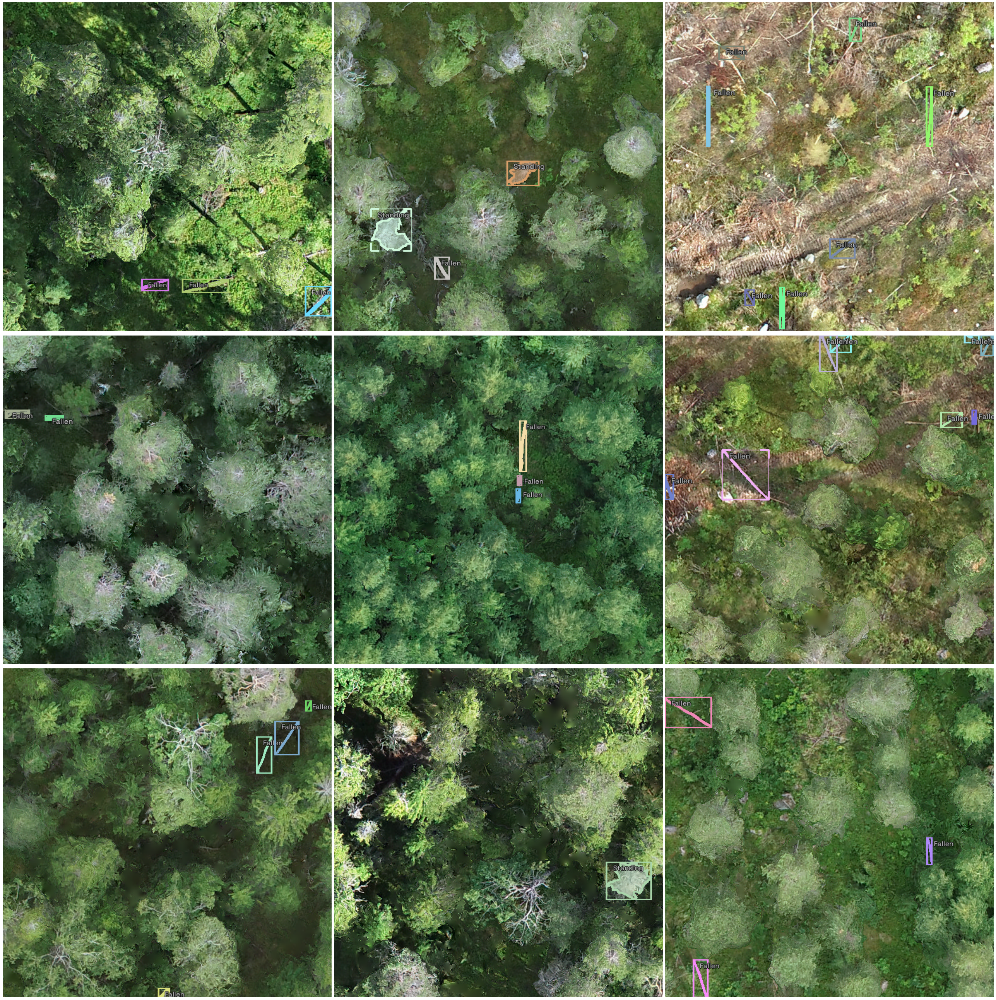

In [15]:
ix = random.randint(0, (len(train)-9))
show_records(train[ix:ix+9], ncols=3, class_map=class_map, display_bbox=True, display_label=True)

## Methods

Typically, computer vision classification tasks utilizing CNN models can be divided into four different types: \textit{image classification}, \textit{object detection}, \textit{semantic segmentation} or \textit{instance segmentation}. Image classification (assigning one or more labels to a image) is the most common of these, but it has limited use in remote sensing or forestry applications (e.g. [Kattenborn2019a](https://doi.org/10.1038/s41598-019-53797-9). In object detection, the task is to both localize and classify the target from an image, whereas segmentation tasks aim to mark the pixels in which the target is present.  Semantic segmentation assigns the same label for each object type, and it is typically used in land cover mapping tasks. Instance segmentation is a combination of object detection and semantic segmentation, as it aims to differentiate and segment each individual instance from the target image.

The most typically used CNN architectures are U-net ([Ronneberger2015](http://dx.doi.org/10.1007/978-3-319-24574-4_28)) for semantic segmentation, Mask R-CNN ([He2020](http://dx.doi.org/10.1109/TPAMI.2018.2844175)) for instance segmentation, and Faster R-CNN ([Ren2017](http://dx.doi.org/10.1109/TPAMI.2016.2577031)), RetinaNet ([Lin2020](http://dx.doi.org/10.1109/TPAMI.2018.2858826)) and YOLOv3 ([Redmon2018](http://arxiv.org/abs/1804.02767)) for object detection. As the task in here was instance segmentation, we used Mask R-CNN with pretrained ResNet50 as the backbone, and fine-tuned it for our task. 

## Evaluation

To evaluate our collection of predicted masks, we'll compare each of our predicted masks with each of the available target masks for a given input. 

* A **true positive** (TP), when a prediction-target mask pair has an IoU score which exceeds some predefined threshold
* A **false positive** (FP), when a predicted object had no associated ground truth object mask
* A **false negative** (FN) indicates a ground truth object mask had no associated predicted object mask
* **True negative** (TN) is not useful in object detection, as each image has infinite number of different masks that have no corresponding ground truth

In the case of multiple detections, the one with the largest IoU is considered to be "correct" and others are FP.

From these, we can get **Precision** and **Recall**

$Precision = \frac{TP}{TP + FP} = \frac{TP}{all \: detections}, Recall = \frac{TP}{TP+FN} = \frac{TP}{all \: ground \: truths}$

And use these to derive other metrics.

Typical metrics include **Average Precision** (AP) and **mean Average Precision** (mAP). From these several metrics can be derived:

* AP50, AP75, AP[.50:.05:.95] are the most common, with AP[.50:.05:.95] being the primary challenge metric in COCO
* AP Across scales: AP<sub>small</sub>, AP<sub>medium</sub>, AP<sub>large</sub>, where small, medium and large have specified areas
    * Scales for COCO are less than 32² for small, between 32² and 96² for medium and more than 96² for large, sizes in pixels
    * Our data has variable resolution sizes, but on average the resolution is around 0.05m, so small is less than 2.56m², medium is between 2.56m² and 23.04m², and large is more than 23.04m²
* **Average Recall** (AR) is also sometimes used similarly, but with restrictions for the number of detections per image
    * It is computed as the area under Recall-IoU -curve for IoU thresholds from [0.5, 1]
* All of these can be applied to bounding boxes and masks

In this work, we apply different AP metrics, as well as IoU for the holdout set.

# Results

## Model training

### Augmentations

As is the standard for training computer vision models, we applied a set of augmentations to practically increase the amount of the training data. All images were randomly flipped horizontally, the values in R, G and B channels were shifted by a random number between -10 and 10, brightness and contrast of the images were increased or decreased by the factor of 0.2, image was randomly slightly blurred, and 400 times 400 patch of the image was randomly cropped from the image. Each individual augmentation had a probability of 0.5 to be applied. 

In [17]:
# Specify `shift_scale_rotate=None` due to some issues with it.

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=400, presize=500, shift_scale_rotate=None), 
                             tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(500), tfms.A.Normalize()])
train_ds = Dataset(train, train_tfms)
valid_ds = Dataset(valid, valid_tfms)

In [18]:
mask_rcnn = models.torchvision.mask_rcnn

In [22]:
backbone = mask_rcnn.backbones.resnext50_32x4d_fpn(pretrained=True)

In [23]:
train_dl = mask_rcnn.train_dl(train_ds, batch_size=16, shuffle=True, num_workers=4)
valid_dl = mask_rcnn.valid_dl(valid_ds, batch_size=16, shuffle=False, num_workers=4)

# Use AP[.50:.05:.95] as metric to monitor
#metrics = [COCOMetric(metric_type=COCOMetricType.mask)] # Mask metric is bugged

model = mask_rcnn.model(num_classes=len(parser.class_map))
learn = mask_rcnn.fastai.learner(dls=[train_dl, valid_dl], model=model)#, metrics=metrics)


SuggestedLRs(valley=0.0004786300996784121)

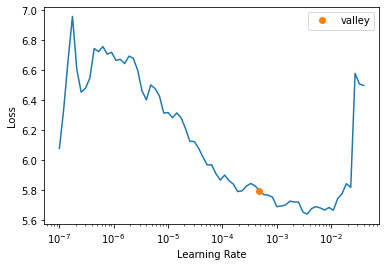

In [24]:
learn.lr_find()

In [26]:
from fastai.callback.progress import ShowGraphCallback

epoch,train_loss,valid_loss,time
0,4.982568,4.163970,00:34
1,4.777153,4.093305,00:30


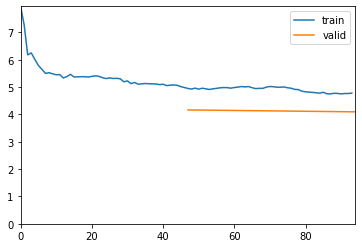

epoch,train_loss,valid_loss,time
0,1.399412,0.967738,00:58
1,1.133471,0.934721,01:14
2,1.038105,0.896701,01:07
3,0.975125,0.869493,01:04
4,0.928504,0.859452,01:06
5,0.890217,0.845977,01:04
6,0.847669,0.841570,01:03
7,0.828186,0.827434,00:57
8,0.802891,0.823247,01:01
9,0.786582,0.819156,00:58


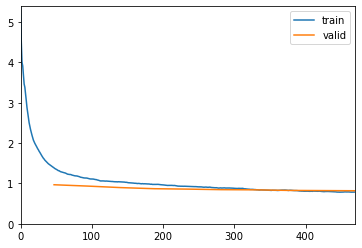

In [27]:
learn.fine_tune(10, 5e-4, freeze_epochs=2, cbs=ShowGraphCallback())

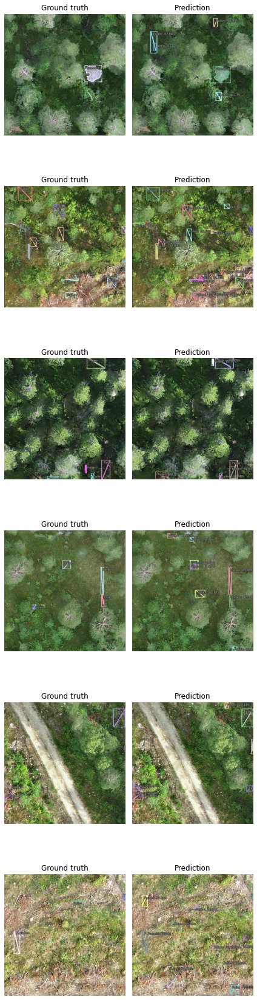

In [28]:
mask_rcnn.show_results(model, valid_ds)

In [30]:
torch.save(model.state_dict(), 'hiidenportti_models/hiidenportti_resnext50_5cm_buffer.pth')

## Results for test set

In [98]:
from pathlib import Path
from drone_detector.tiling import *
import os, sys
import geopandas as gpd

import matplotlib.pyplot as plt

from drone_detector.predict import predict_instance_masks


In [99]:
test_rasters = [f'../data/hiidenportti/raw/test_plot_patches/{f}' 
                for f in os.listdir('../data/hiidenportti/raw/test_plot_patches') if f.endswith('tif')]

In [119]:
for t in test_rasters:
    outfile_name = f'../data/hiidenportti/results/no_nms/predicted_vectors/{t.split("/")[-1][:-4]}.geojson'
    predict_instance_masks('hiidenportti_models/hiidenportti_resnext50_5cm_buffer.pth', 
                           t,
                           outfile_name,
                           tile_size=550,
                           tile_overlap=225)

Reading and tiling ../data/hiidenportti/raw/test_plot_patches/1053_Hiidenportti_Chunk9_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

292 polygons before non-max suppression
292 polygons after non-max suppression
Removing intermediate files
Reading and tiling ../data/hiidenportti/raw/test_plot_patches/10_Hiidenportti_Chunk4_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

237 polygons before non-max suppression
237 polygons after non-max suppression
Removing intermediate files
Reading and tiling ../data/hiidenportti/raw/test_plot_patches/1035_Hiidenportti_Chunk5_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/48 [00:00<?, ?it/s]

367 polygons before non-max suppression
367 polygons after non-max suppression
Removing intermediate files
Reading and tiling ../data/hiidenportti/raw/test_plot_patches/1025_Hiidenportti_Chunk5_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

230 polygons before non-max suppression
230 polygons after non-max suppression
Removing intermediate files
Reading and tiling ../data/hiidenportti/raw/test_plot_patches/109_Hiidenportti_Chunk5_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

191 polygons before non-max suppression
191 polygons after non-max suppression
Removing intermediate files
Reading and tiling ../data/hiidenportti/raw/test_plot_patches/1047_Hiidenportti_Chunk4_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/41 [00:00<?, ?it/s]

161 polygons before non-max suppression
161 polygons after non-max suppression
Removing intermediate files
Reading and tiling ../data/hiidenportti/raw/test_plot_patches/11_Hiidenportti_Chunk4_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

402 polygons before non-max suppression
402 polygons after non-max suppression
Removing intermediate files
Reading and tiling ../data/hiidenportti/raw/test_plot_patches/114_Hiidenportti_Chunk5_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

263 polygons before non-max suppression
263 polygons after non-max suppression
Removing intermediate files
Reading and tiling ../data/hiidenportti/raw/test_plot_patches/1038_Hiidenportti_Chunk7_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/49 [00:00<?, ?it/s]

365 polygons before non-max suppression
365 polygons after non-max suppression
Removing intermediate files
Reading and tiling ../data/hiidenportti/raw/test_plot_patches/1033_Hiidenportti_Chunk3_orto.tif to 550x550 tiles with overlap of 225px


0it [00:00, ?it/s]

Loading model
Starting predictions


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

0it [00:00, ?it/s]

/scratch/mayrajan/drone_detector/drone_detector/coco.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  contours = np.subtract(contours, 1)


  0%|          | 0/49 [00:00<?, ?it/s]

  0%|          | 0/46 [00:00<?, ?it/s]

338 polygons before non-max suppression
338 polygons after non-max suppression
Removing intermediate files


### Clip results to have same spatial area than ground truth

In [120]:
import geopandas as gpd
from shapely.geometry import box

In [121]:
res_test_pairs = [(f'../data/hiidenportti/results/no_nms/predicted_vectors/{fname}',
                   f'../data/hiidenportti/raw/test_vector_plots/{fname.split("_")[0]}.shp',
                   f"../data/hiidenportti/raw/test_plot_patches/{fname.replace('geojson', 'tif')}")
                  for fname in os.listdir('../data/hiidenportti/results/no_nms/predicted_vectors/') if fname.endswith('geojson')]

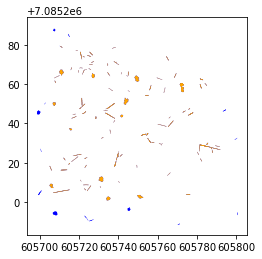

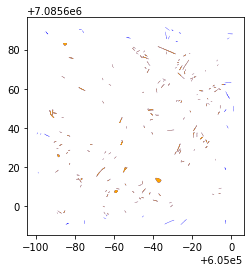

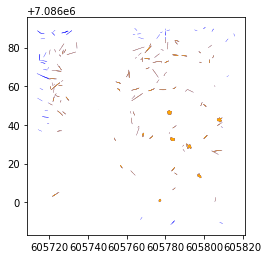

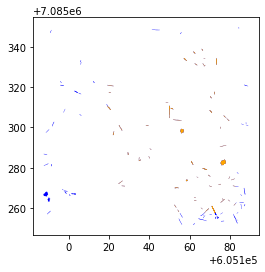

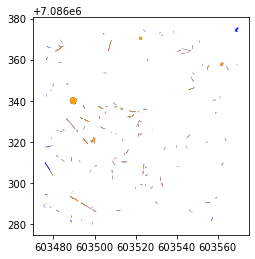

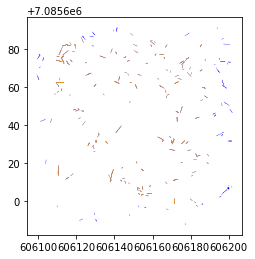

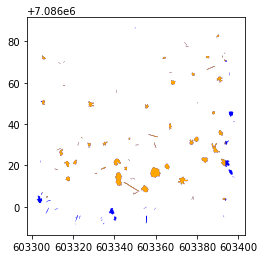

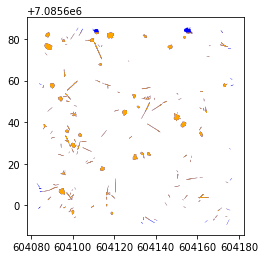

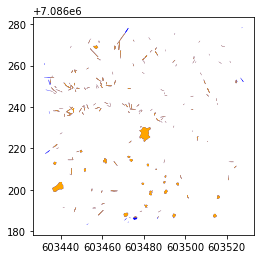

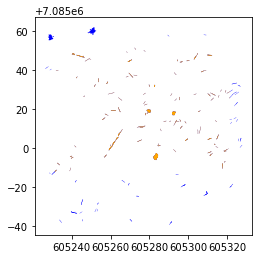

In [122]:
for r, t, im in res_test_pairs:
    fig, axs = plt.subplots(1,1)
    temp_results = gpd.read_file(r)
    temp_results.plot(ax=axs, facecolor='blue')
    temp_gt = gpd.read_file(t)
    temp_results = gpd.clip(temp_results, box(*temp_gt.total_bounds), keep_geom_type=True)
    temp_results.plot(ax=axs, facecolor='orange')
    temp_results.to_file(r, driver='GeoJSON')

### No postprocessing

Compute overall dissolved IOU

In [123]:
results = None
ground_truth = None

for r, t, im in res_test_pairs:
    temp_results = gpd.read_file(r)
    temp_gt = gpd.read_file(t)
    temp_gt = gpd.clip(temp_gt, box(*temp_results.total_bounds), keep_geom_type=True)
    temp_results = gpd.clip(temp_results, box(*temp_gt.total_bounds), keep_geom_type=True)
    temp_gt['plot_id'] = int(t.split('/')[-1].split('.')[0])
    temp_results['plot_id'] = int(t.split('/')[-1].split('.')[0])
    temp_gt['image_path'] = im
    temp_results['image_path'] = im
    if ground_truth is None: 
        ground_truth = temp_gt.copy()
        results = temp_results.copy()
    else:
        ground_truth = ground_truth.append(temp_gt)
        temp_gt = None
        results = results.append(temp_results)
        temp_results = None
ground_truth['geometry'] = ground_truth.geometry.buffer(0.05)

In [124]:
ground_truth.rename(columns={'groundwood':'label'}, inplace=True)

In [125]:
from drone_detector.metrics import *

In [126]:
gt_dis = ground_truth.dissolve(by='label')
res_dis = results.dissolve(by='label')
poly_IoU(gt_dis, res_dis)

label
1    0.288717
2    0.432455
dtype: float64

Run COCO metrics

In [127]:
deadwood_categories = [{'supercategory': 'deadwood', 'id':1, 'name':'uprightwood'},
                      {'supercategory': 'deadwood', 'id':2, 'name':'groundwood'}]

raw_coco_eval = GisCOCOeval('../data/hiidenportti/results/no_nms/', '../data/hiidenportti/results/no_nms/', 
                            None, None, deadwood_categories)

In [128]:
raw_coco_eval.prepare_data(gt_label_col='layer')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [129]:
raw_coco_eval.prepare_eval()

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!


In [130]:
raw_coco_eval.evaluate()


Evaluating for category uprightwood
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.06s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.163
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.317
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.184
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.078
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.247
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.400
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.300
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.471
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000

Evaluating for category

### Do score-based NMS with threshold of 0.7

If two or more predicted masks have bounding box IoU of more than 0.7, keep only the one with the highest score.

In [131]:
from drone_detector.utils import non_max_suppression_fast
from pathlib import Path
import numpy as np

In [132]:
def do_nms(gdf:gpd.GeoDataFrame, nms_thresh=0.7, crit='score'):
    print(f'{len(gdf)} polygons before NMS')
    gdf = gdf.copy()
    np_bboxes = np.array([b.bounds for b in gdf.geometry])
    scores = gdf.score.values
    idxs = non_max_suppression_fast(np_bboxes, scores, nms_thresh, crit)
    print(f'{len(idxs)} polygons after NMS')
    gdf = gdf.iloc[idxs]
    return gdf

In [133]:
raw_dir = Path('../data/hiidenportti/results/no_nms/predicted_vectors/')
nms_dir = Path('../data/hiidenportti/results/nms/predicted_vectors/')
raw_files = os.listdir(raw_dir)

In [134]:
for r in raw_files:
    gdf_temp = gpd.read_file(raw_dir/r)
    gdf_nms = do_nms(gdf_temp)
    gdf_nms.to_file(nms_dir/r, driver='GeoJSON')
    gdf_nms = None
    gdf_temp = None

202 polygons before NMS
112 polygons after NMS
325 polygons before NMS
167 polygons after NMS
239 polygons before NMS
117 polygons after NMS
106 polygons before NMS
63 polygons after NMS
213 polygons before NMS
123 polygons after NMS
281 polygons before NMS
142 polygons after NMS
114 polygons before NMS
73 polygons after NMS
324 polygons before NMS
168 polygons after NMS
385 polygons before NMS
187 polygons after NMS
193 polygons before NMS
98 polygons after NMS


Poly IoU

In [135]:
res_nms = do_nms(results)

2382 polygons before NMS
1244 polygons after NMS


In [136]:
res_nms_dis = res_nms.dissolve(by='label')

In [137]:
poly_IoU(gt_dis, res_nms_dis)

label
1    0.288598
2    0.419268
dtype: float64

In [138]:
deadwood_categories = [{'supercategory': 'deadwood', 'id':1, 'name':'uprightwood'},
                      {'supercategory': 'deadwood', 'id':2, 'name':'groundwood'}]

nms_coco_eval = GisCOCOeval('../data/hiidenportti/results/nms/', '../data/hiidenportti/results/nms/', 
                            None, None, deadwood_categories)

In [139]:
nms_coco_eval.prepare_data(gt_label_col='layer')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [140]:
nms_coco_eval.prepare_eval()

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!


In [141]:
nms_coco_eval.evaluate()


Evaluating for category uprightwood
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.05s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.413
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.199
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.142
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.271
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.390
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.294
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.458
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000

Evaluating for category

### Area-based NMS

If two or more predicted masks have bounding box IoU larger than 0.7, keep the largest mask and discard the others.

Poly IoU

In [142]:
res_area_nms = do_nms(results, crit='area')

2382 polygons before NMS
1148 polygons after NMS


In [143]:
res_nms_dis = res_nms.dissolve(by='label')

In [144]:
poly_IoU(gt_dis, res_nms_dis)

label
1    0.288598
2    0.419268
dtype: float64

COCO metrics

In [145]:
raw_dir = Path('../data/hiidenportti/results/no_nms/predicted_vectors/')
area_nms_dir = Path('../data/hiidenportti/results/area_nms/predicted_vectors/')
raw_files = os.listdir(raw_dir)

In [146]:
for r in raw_files:
    gdf_temp = gpd.read_file(raw_dir/r)
    gdf_nms = do_nms(gdf_temp, crit='area')
    gdf_nms.to_file(area_nms_dir/r, 'GeoJSON')
    gdf_nms = None
    gdf_temp = None

202 polygons before NMS
97 polygons after NMS
325 polygons before NMS
155 polygons after NMS
239 polygons before NMS
107 polygons after NMS
106 polygons before NMS
57 polygons after NMS
213 polygons before NMS
116 polygons after NMS
281 polygons before NMS
134 polygons after NMS
114 polygons before NMS
65 polygons after NMS
324 polygons before NMS
152 polygons after NMS
385 polygons before NMS
174 polygons after NMS
193 polygons before NMS
91 polygons after NMS


In [147]:
deadwood_categories = [{'supercategory': 'deadwood', 'id':1, 'name':'uprightwood'},
                      {'supercategory': 'deadwood', 'id':2, 'name':'groundwood'}]

area_nms_coco_eval = GisCOCOeval('../data/hiidenportti/results/area_nms/', '../data/hiidenportti/results/area_nms/', 
                            None, None, deadwood_categories)

In [148]:
area_nms_coco_eval.prepare_data(gt_label_col='layer')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [149]:
area_nms_coco_eval.prepare_eval()

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!


In [150]:
area_nms_coco_eval.evaluate()


Evaluating for category uprightwood
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.204
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.411
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.223
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.161
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.255
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.294
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.446
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000

Evaluating for category

### Score-based, labelwise NMS

If two or more predicted masks have same label and bounding box IoU larger than 0.7, keep the one with highest score.

Poly IOU

In [168]:
standing = results[results.label==1].copy()
fallen = results[results.label==2].copy()

standing = do_nms(standing)
fallen = do_nms(fallen)

res_label_nms = standing.append(fallen)

217 polygons before NMS
149 polygons after NMS
2165 polygons before NMS
1099 polygons after NMS


In [169]:
res_label_dis = res_label_nms.dissolve(by='label')

In [170]:
poly_IoU(gt_dis, res_label_dis)

label
1    0.288478
2    0.420120
dtype: float64

In [171]:
raw_dir = Path('../data/hiidenportti/results/no_nms/predicted_vectors/')
label_nms_dir = Path('../data/hiidenportti/results/label_nms/predicted_vectors/')
raw_files = os.listdir(raw_dir)

In [172]:
for r in raw_files:
    gdf_temp = gpd.read_file(raw_dir/r)
    standing = gdf_temp[gdf_temp.label==1].copy()
    fallen = gdf_temp[gdf_temp.label==2].copy()

    standing = do_nms(standing)
    fallen = do_nms(fallen)
    gdf_nms = standing.append(fallen)
    gdf_nms.to_file(label_nms_dir/r, driver='GeoJSON')
    gdf_nms = None
    #gdf_temp = None
    standing = None
    fallen = None

21 polygons before NMS
17 polygons after NMS
181 polygons before NMS
95 polygons after NMS
7 polygons before NMS
5 polygons after NMS
318 polygons before NMS
162 polygons after NMS
17 polygons before NMS
13 polygons after NMS
222 polygons before NMS
106 polygons after NMS
7 polygons before NMS
4 polygons after NMS
99 polygons before NMS
59 polygons after NMS
7 polygons before NMS
5 polygons after NMS
206 polygons before NMS
117 polygons after NMS
2 polygons before NMS
1 polygons after NMS
279 polygons before NMS
140 polygons after NMS
65 polygons before NMS
41 polygons after NMS
49 polygons before NMS
32 polygons after NMS
52 polygons before NMS
36 polygons after NMS
272 polygons before NMS
132 polygons after NMS
33 polygons before NMS
24 polygons after NMS
352 polygons before NMS
164 polygons after NMS
6 polygons before NMS
3 polygons after NMS
187 polygons before NMS
96 polygons after NMS


In [173]:
deadwood_categories = [{'supercategory': 'deadwood', 'id':1, 'name':'uprightwood'},
                      {'supercategory': 'deadwood', 'id':2, 'name':'groundwood'}]

label_nms_coco_eval = GisCOCOeval('../data/hiidenportti/results/label_nms/', '../data/hiidenportti/results/label_nms/', 
                            None, None, deadwood_categories)

In [174]:
label_nms_coco_eval.prepare_data(gt_label_col='layer')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [175]:
label_nms_coco_eval.prepare_eval()

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!


In [176]:
label_nms_coco_eval.evaluate()


Evaluating for category uprightwood
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.199
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.405
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.198
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.134
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.271
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.390
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.294
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.458
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000

Evaluating for category

### Area-based, labelwise NMS

If two or more masks have same label and bounding box IoU more than 0.7, keep the largest mask.

Poly IOU

In [177]:
standing = results[results.label==1].copy()
fallen = results[results.label==2].copy()

standing = do_nms(standing, crit='area')
fallen = do_nms(fallen, crit='area')

res_label_nms = standing.append(fallen)

217 polygons before NMS
131 polygons after NMS
2165 polygons before NMS
1022 polygons after NMS


In [178]:
res_label_dis = res_label_nms.dissolve(by='label')

In [179]:
poly_IoU(gt_dis, res_label_dis)

label
1    0.289445
2    0.415524
dtype: float64

In [180]:
raw_dir = Path('../data/hiidenportti/results/no_nms/predicted_vectors/')
area_label_nms_dir = Path('../data/hiidenportti/results/area_label_nms/predicted_vectors/')
raw_files = os.listdir(raw_dir)

In [181]:
for r in raw_files:
    gdf_temp = gpd.read_file(raw_dir/r)
    standing = gdf_temp[gdf_temp.label==1].copy()
    fallen = gdf_temp[gdf_temp.label==2].copy()

    standing = do_nms(standing, crit='area')
    fallen = do_nms(fallen, crit='area')
    gdf_nms = standing.append(fallen)
    gdf_nms.to_file(area_label_nms_dir/r, driver='GeoJSON')
    gdf_nms = None
    #gdf_temp = None
    standing = None
    fallen = None

21 polygons before NMS
12 polygons after NMS
181 polygons before NMS
85 polygons after NMS
7 polygons before NMS
5 polygons after NMS
318 polygons before NMS
150 polygons after NMS
17 polygons before NMS
9 polygons after NMS
222 polygons before NMS
98 polygons after NMS
7 polygons before NMS
3 polygons after NMS
99 polygons before NMS
54 polygons after NMS
7 polygons before NMS
5 polygons after NMS
206 polygons before NMS
111 polygons after NMS
2 polygons before NMS
1 polygons after NMS
279 polygons before NMS
133 polygons after NMS
65 polygons before NMS
37 polygons after NMS
49 polygons before NMS
30 polygons after NMS
52 polygons before NMS
33 polygons after NMS
272 polygons before NMS
121 polygons after NMS
33 polygons before NMS
23 polygons after NMS
352 polygons before NMS
151 polygons after NMS
6 polygons before NMS
3 polygons after NMS
187 polygons before NMS
89 polygons after NMS


In [182]:
deadwood_categories = [{'supercategory': 'deadwood', 'id':1, 'name':'uprightwood'},
                      {'supercategory': 'deadwood', 'id':2, 'name':'groundwood'}]

area_label_nms_coco_eval = GisCOCOeval('../data/hiidenportti/results/area_label_nms/', '../data/hiidenportti/results/area_label_nms/', 
                            None, None, deadwood_categories)

In [183]:
area_label_nms_coco_eval.prepare_data(gt_label_col='layer')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [184]:
area_label_nms_coco_eval.prepare_eval()

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!


In [185]:
area_label_nms_coco_eval.evaluate()


Evaluating for category uprightwood
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.409
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.162
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.251
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.294
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.446
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000

Evaluating for category